# Exploratory Data Analysis

Here I will also include the test dataset in the analysis but I will actually only train on the train/test split given in the dataset.

In [1]:
import hvplot.pandas

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow import keras
from keras.applications import imagenet_utils

Some parameters:

In [2]:
DATASET_SIZE = 9367
IMAGE_SIZE = 224
BATCH_SIZE = 8

BASE_PATH='../data'

classes = [
    'cup', 
    'fork', 
    'glass', 
    'knife', 
    'plate', 
    'spoon'
]

Loading Dataset:

In [3]:
df_train = pd.read_csv('data/train.csv', dtype={'Id': str})
df_train['filename'] = 'data/images/' + df_train['Id'] + '.jpg'
df_train.head()

,Id,label,filename
0,0560,glass,data/images/0560.jpg
1,4675,cup,data/images/4675.jpg
2,0875,glass,data/images/0875.jpg
3,4436,spoon,data/images/4436.jpg
4,8265,plate,data/images/8265.jpg


In [4]:
len(df_train)

5559

So, we have 5559 training images. This is a decent amount to consider transfer learning. We can consider image augmentation for more data and cross-validation so our results are not over-optimistic.

Just for sanity:

In [5]:
df_train.isnull().sum()

Id          0
label       0
filename    0
dtype: int64

Let's take a look at the class balance:

In [6]:
counts = df_train['label'].value_counts()

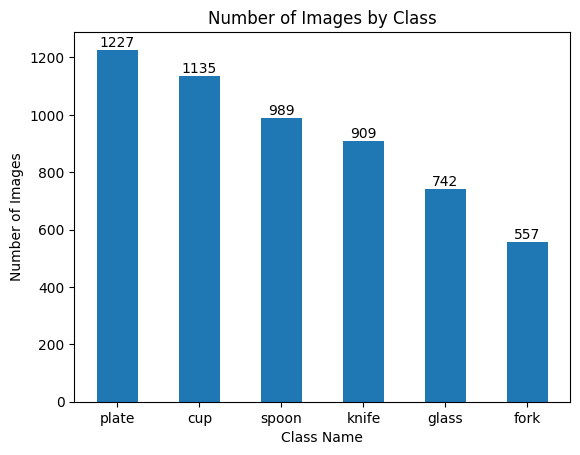

In [7]:
fig, ax = plt.subplots()

plot = ax.bar(counts.keys(), counts, width = .5)
ax.set_title("Number of Images by Class")
ax.set_xlabel('Class Name')
ax.set_ylabel('Number of Images')
ax.bar_label(plot)

plt.show()

There is a notable imbalance. There are over 1200 images for *plates*, and this decreases by about 100 examples for each class.
- The *fork* class has less than half the examples as the *plate* class

Let's take a look at the images themselves. We'll randomly sample each class:

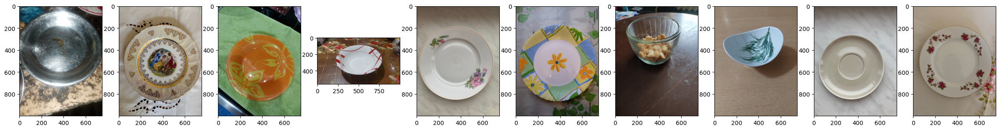

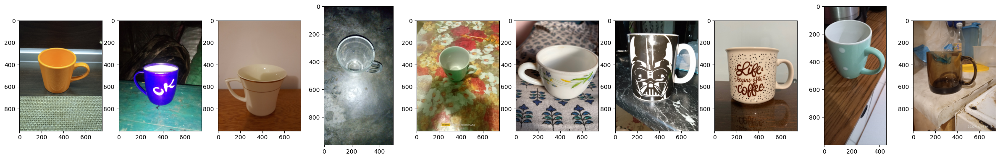

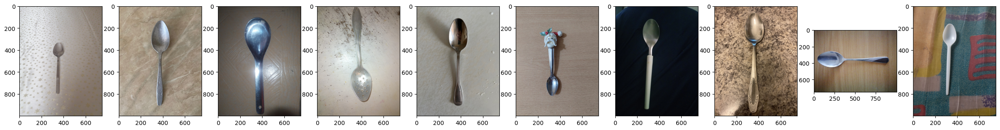

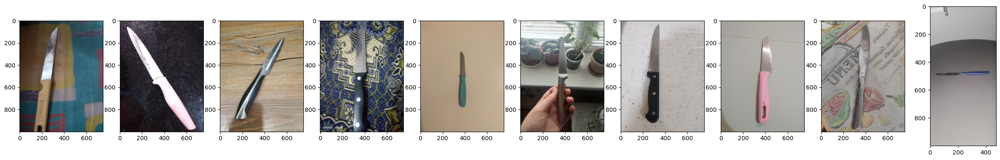

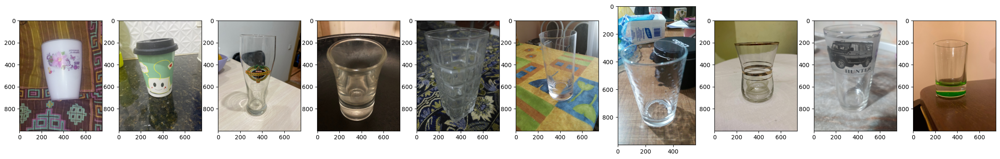

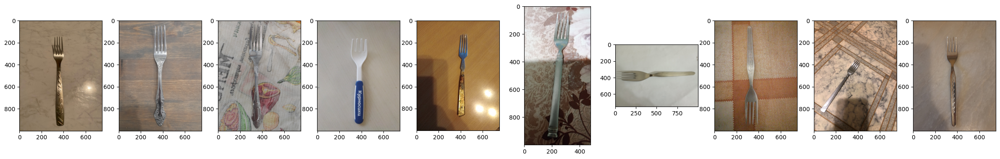

In [8]:
for i, label in enumerate(counts.keys()):
    plt.figure(figsize=(30, 30))
    for j in range(10):
        df = df_train[df_train['label']==label].sample()
        ax = plt.subplot(len(classes), 10, j + 1)
        image = tf.keras.utils.load_img(df.filename.values[0])
        plt.imshow(image)
    plt.show()

These are decent quality, relatively large images.
- Angles of plates, mugs, and glasses differ greatly (flipping)
- Rotation of cutler is generally at a 90-degree angle (rotation)
- Some objects shine quite a bit. (brightness/contrast)

These may inform our image augmentation later.

We noted that these images were mostly large. Lets take a closer look at the **resolutions**.

In [9]:
df_height = pd.DataFrame(columns = counts.keys())
df_width = pd.DataFrame(columns = counts.keys())
df_height

,plate,cup,spoon,knife,glass,fork


In [10]:
# for i, label in enumerate(counts.keys()):
#     plt.figure(figsize=(10, 10))
#     df = df_train[df_train['label']==label]
heights = []
widths = []
for filename in df_train.filename.values:
    image = tf.keras.utils.load_img(filename)
    w, h = image.size
    heights.append(h)
    widths.append(w)
    del image
df_train['height'] = heights
df_train['width'] = widths

In [11]:
df_train.describe()

,height,width
count,5559.000000,5559.000000
mean,973.302572,744.029682
std,92.929490,121.047108
min,233.000000,174.000000
25%,1000.000000,750.000000
50%,1000.000000,750.000000
75%,1000.000000,750.000000
max,1000.000000,1000.000000


In [12]:
for i, label in enumerate(counts.keys()):
    df = df_train[df_train['label']==label]
    print(f'{label} class:')
    display(df.describe())

plate class:


,height,width
count,1227.000000,1227.000000
mean,964.392828,750.932355
std,108.219698,126.055127
min,233.000000,174.000000
25%,1000.000000,750.000000
50%,1000.000000,750.000000
75%,1000.000000,750.000000
max,1000.000000,1000.000000


cup class:


,height,width
count,1135.000000,1135.000000
mean,975.391189,738.154185
std,93.218090,122.735265
min,233.000000,174.000000
25%,1000.000000,750.000000
50%,1000.000000,750.000000
75%,1000.000000,750.000000
max,1000.000000,1000.000000


spoon class:


,height,width
count,989.000000,989.000000
mean,975.370071,744.994944
std,87.449862,121.009188
min,439.000000,439.000000
25%,1000.000000,750.000000
50%,1000.000000,750.000000
75%,1000.000000,750.000000
max,1000.000000,1000.000000


knife class:


,height,width
count,909.000000,909.000000
mean,970.345435,751.732673
std,92.845198,121.545445
min,233.000000,174.000000
25%,1000.000000,750.000000
50%,1000.000000,750.000000
75%,1000.000000,750.000000
max,1000.000000,1000.000000


glass class:


,height,width
count,742.000000,742.000000
mean,986.745283,726.738544
std,71.044500,108.241516
min,233.000000,174.000000
25%,1000.000000,750.000000
50%,1000.000000,750.000000
75%,1000.000000,750.000000
max,1000.000000,1000.000000


fork class:


,height,width
count,557.000000,557.000000
mean,971.921005,749.545781
std,89.093481,119.349632
min,233.000000,174.000000
25%,1000.000000,750.000000
50%,1000.000000,750.000000
75%,1000.000000,750.000000
max,1000.000000,1000.000000


Noticably, the spoon class has the largest images on the small end of its class (439 x 439 pixels).
- This is an outlier compared to the other classes, especially when cutlery is long and thin rather than square

Most of the images are in fact quite large, with at least 75% being 750 x 1000 pixels. Let's see this **by class**:

In [30]:
sizes = df_train.groupby(['height', 'width']).size().reset_index().rename(columns={0:'count'})
sizes.hvplot.scatter(x='width', y='height', size='count', xlim=(100,1100), ylim=(100,1100), grid=True, xticks=2, 
        yticks=2, height=500, width=600).options(line_alpha=1, fill_alpha=0)

:Scatter   [width]   (height,count)

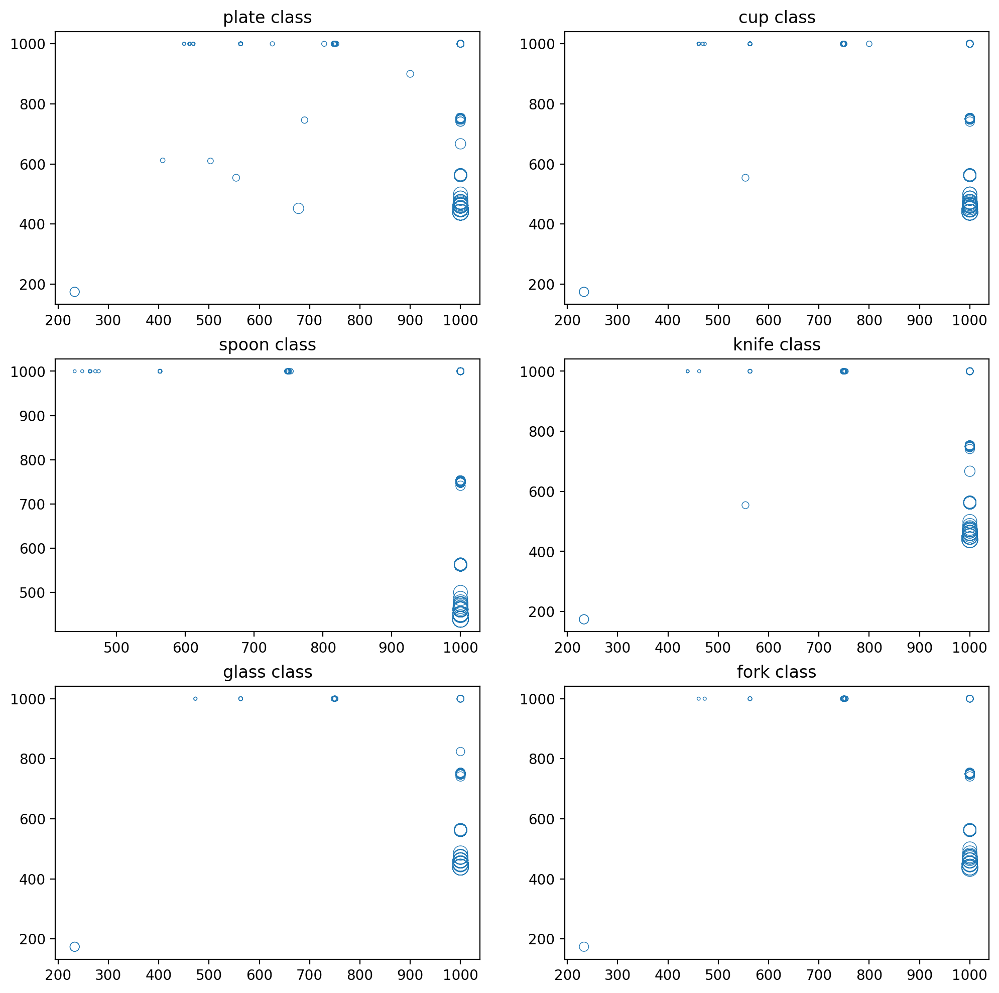

In [66]:
fig, ax = plt.subplots(nrows=3, ncols=2)
plt.rcParams['figure.figsize'] = (12, 12)
fig.set_dpi(200)
for i, label in enumerate(counts.keys()):
    df = df_train[df_train['label']==label]
    s = (5 * df.height.values / df.width.values)**2
    ax = plt.subplot(int(len(classes)/2), 2, i + 1)
    ax.scatter(df.height.values, df.width.values, s=s, edgecolors='tab:blue', facecolors='none', linewidth=0.5)
    ax.set_title(f'{label} class')
plt.show()

Noticeably:
- Plates has the most outliers
- Spoons has the least (though some are not shown)
- Glasses and forks have the most and most extreme outliers